In [7]:
import pandas as pd
import re
import datetime
import numpy as np
import matplotlib.pyplot as plt
import string 
import warnings
warnings.simplefilter('ignore')


In [8]:
# Display all rows width and length
pd.set_option('display.max_columns', None) 
pd.set_option('display.max_rows', None) 
pd.set_option('display.max_colwidth', None)  

In [9]:
def load_data(resume_path):
    df = pd.read_excel(resume_path)
    df.columns = [remove_space(name) for name in df.columns.to_list()]
    return df

In [10]:
def load_data2(resume_path_name, train_data_path_name):
    df =  pd.read_csv(resume_path_name)
#     df_train =  pd.read_csv(train_data_path_name)
#     df_train = df_train[['employee_code', 'hp_class']]
    df = df[['employee_code', 'employee_name', 'clean_text', 'resume_text']]
#     df_out = df_train.merge(df, on='employee_code')
    return  df#df_out

In [11]:
def remove_space(text):
    text = re.sub(r'\s+$', '', text) 
    text = re.sub(r'^\s+', '', text)
    return text

In [12]:
def cap_words(words):
    try:
        new_word = string.capwords(words)
        return new_word
    except AttributeError:
        return np.nan

### Add Basic text cleaner to read from the resume version and not from the clean

In [13]:
def clean_txt_f(txt):
    txt = str(txt)
    punct_list = list(string.punctuation+"·"+"−"+"§"+"•"+"–"+"––"+"✓"+"❖"+"❑")
    punct_list.remove("&")
    punct_list.remove("@")
    punct_list.remove("/")
    exclude = set(punct_list)    
    clean_txt = "".join([i for i in txt.lower() if i not in exclude])
    clean_txt = re.sub(r'\s+', ' ', clean_txt)
    #Remove Emails
    clean_txt = re.sub(r'([\w\.-]+@[\w\.-]+)', '', clean_txt)
    clean_txt = clean_txt.replace("/", " ")
    return clean_txt

In [14]:
clean_txt = 'SHELLY BIRLA 1293 Midland Avenue Toronto, ON M1K4H4 Tel: (647) 554 - 5181 shelly_birla@hotmail.com References av'
clean_txt = re.sub(r'([\w\.-]+@[\w\.-]+)', '', clean_txt)
clean_txt

'SHELLY BIRLA 1293 Midland Avenue Toronto, ON M1K4H4 Tel: (647) 554 - 5181  References av'

In [15]:
clean_txt = 'SHELLY BIRLA 1293 Midland Avenue Toronto, & ON M1K4H4 Tel: (647) 554 - 5181 shelly_birla@hotmail.com References av'
clean_txt_f(clean_txt)

'shelly birla 1293 midland avenue toronto & on m1k4h4 tel 647 554 5181  references av'

In [16]:
word = "telco"

cap_words(word)

'Telco'

In [17]:
def find_competitor(company, competitor_lst):
    pat_comp =r'.*?(\b(?:{})\b).*?'.format('|'.join(competitor_lst))
    try:
        return re.match(pat_comp, company).group(1)
    except AttributeError:
        return np.nan
    except TypeError:
        return np.nan

In [18]:
def find_competitor2(txt, competitor_lst):
    txt = str(txt).lower()
    competitor_lst = [item.lower() for item in competitor_lst]
    pat_comp =r'.*?(\b(?:{})\b).*?'.format('|'.join(competitor_lst))
    try:
        return re.match(pat_comp, txt).group(1)
    except AttributeError:
        return np.nan
    except TypeError:
        return np.nan

In [19]:
def find_competitor_list(txt, competitor_lst):
    txt = str(txt).lower()
    competitor_lst = [item.lower() for item in competitor_lst]
    pat_comp =r'.*?(\b(?:{})\b).*?'.format('|'.join(competitor_lst))
    
    found_list = re.findall(pat_comp, txt)
    new_list = found_list
    # Do not include item found before or after Experience section (Quick & Dirty)
    if ("work experience") in found_list:
        if ("work experience" and "references") in found_list: 
            new_list = found_list[found_list.index('work experience'):found_list.index('references')] 
        else:
            new_list = found_list[found_list.index('work experience'):]
            
    elif ("work history") in found_list:
        if ("work history" and "references") in found_list: 
            new_list = found_list[found_list.index('work history'):found_list.index('references')]
        else:
            new_list = found_list[found_list.index('work history'):]
            
    elif ("employment history") in found_list:
        if ("employment history" and "references") in found_list:
            new_list = found_list[found_list.index('employment history'):found_list.index('references')]
        else:
            new_list = found_list[found_list.index('employment history'):]
    
    elif ("volunteered") in found_list:
        if ("volunteered" and "references") in found_list:
            new_list = found_list[found_list.index('volunteered'):found_list.index('references')]
        else:
            new_list = found_list[found_list.index('volunteered'):]
            
    elif ("references") in found_list:
        new_list = found_list[:found_list.index('references')]
    else:
        new_list = found_list
    
    # Remove any reference word used
    ref_list = ['employment history', 'work experience', "work history", 'references', 'volunteered']
    new_list = [x for x in new_list if x not in ref_list]
    
    return new_list

In [20]:
txt = "Ashley Whitelaw 220 Brock Street Peterborough Peterborough ON K9H 2P4 (289) 939-4444 awhitelaw99@gmail.com Hardworking employee who thrives under pressure and goes above and beyond to create an unforgettable guest experience. [​ 5 ] years of customer service based experience. Customer-oriented with excellent interpersonal and communication skills, while Maintaining a positive attitude and a great sense of humor during peak hours. Focused and successful at multi-tasking and delivering prompt and friendly service to all customers while providing valuable knowledge to guests while including company values. [​ English​ ]-speaking, Bringing a strong work ethic while maintaining a safe and clean work environment in accordance with health and safety regulations. Skills · Personable · High energy · Collaborative · G2 Driver's license- vehicle owner · Strong math skills · Problem solver Mosaic –Brand Ambassador (Fido) Chatr Representative (Chatr) Team leader- (647) 892-1271 · Interactive promotional activities · Providing helpful information to employees and customers · Interacting with customers to obtain a greater understanding of customers wants · Logging interactions with customers · Logging sales made according to promotions · Keeping a fun and upbeat environment · Keeping employees up to date on current promotions · Updating marketing team on progress November 2017- March 2018 March 2019 – April 2019 Fido-Sales Associate Manager- (905) 922-3384 · On the floor making sales · G.R.E.A.T training · Updating documents on sales throughout the day · Updating daily prep talks · Using Jarvis · Using Kronos · Updating inventory · Receiving shipments to store · Actively participating in team activities · Encouraging friendly competition with coworkers to meet targets April 2018 – September 2018 Rogers-Sales Associate Manager- (416) 602-4025 · On the floor making sales · Counting till at the beginning and end of the day · key holder · Cleaning to open and close · Using RQ4 · Inbound and outbound sales · Dealing with business accounts · Shipping and receiving orders within the company · Inventory counts · Restocking shelves April 2019- Current Employer Education · Smart serve certified · Food handler’s certification · Fleming college - paralegal and law clerk student · G2 Driver · G.R.E.A.T Training · Ajax high school - high school diploma"

In [21]:
text_1 = "SHELLY BIRLA 1293 Midland Avenue Toronto, ON M1K4H4 Tel: (647) 554 - 5181 shelly_birla@hotmail.com References available upon request OBJECTIVE To obtain a full-time position that will enable me to utilize my customer service experience and great communication skills to contribute to your company’s goals and objectives. SKILLS/COMPETENCIES Hardworking, reliable, responsible, and organized Prominent with computers and applications (Word, PowerPoint, Excel) Great time management and organizational skills Strong leadership, communication, and mentoring skills Excellent ability to take initiative and work proactively towards a goal Proficient at multi-tasking and working independently as well as in a group environment WORK EXPERIENCE King Furniture February 2014 – April 2015 Sales associate Possessed a multitude of skills and qualifications to be able to work effectively Performed basic calculations behind the counter Developed and enhanced communication skills through constant engagement Provided customer service throughout the store Transported furniture and arranged it in an appealing and organized manner Dealt with customers and provided them with products they requested The Source (Bell) November 2016 – Ongoing Sales Representative Possessed a multitude of skills and qualifications to be able to work effectively Constantly remaining up-to-date with phone plans and home services Bell and Virgin Mobile had to offer Communicating, connecting, and cross-selling on a daily basis Repeatedly hit monthly sales targets A team player; always supporting and helping fellow associates close sales if needed VOLUNTEER AND EXTRACURRICULAR EXPERIENCE Integral Member, DECA Business Club 2014-2015 Demonstrated basic bookkeeping and accounting principles Appropriately allocated financial resources toward funding of each and every participant Competed at a provincial level while securing position of a city finalist UTSC Science Fair 2013-2017 Directed people to various destinations Moved equipment to their respective places Collected judges’ sheets and calculated scores EDUCATION Graduated David and Mary Thomson C.I. Scarborough, Ontario with honours in June 2015 Currently a student at University of Toronto (Scarborough Campus) enrolled in the Social Science Program, majoring in Psychology"
text_1
text_2 = clean_txt_f(text_1)
text_2

'shelly birla 1293 midland avenue toronto on m1k4h4 tel 647 554 5181  references available upon request objective to obtain a fulltime position that will enable me to utilize my customer service experience and great communication skills to contribute to your company’s goals and objectives skills competencies hardworking reliable responsible and organized prominent with computers and applications word powerpoint excel great time management and organizational skills strong leadership communication and mentoring skills excellent ability to take initiative and work proactively towards a goal proficient at multitasking and working independently as well as in a group environment work experience king furniture february 2014 april 2015 sales associate possessed a multitude of skills and qualifications to be able to work effectively performed basic calculations behind the counter developed and enhanced communication skills through constant engagement provided customer service throughout the sto

In [22]:
competitor_list = ["Employment History", "Work History",'Freedom', 'Koodo', 'Shaw', 'Telus', 'Bell', 'Rogers', 'The Mobile Shop', 
                   'Best Buy', 'Videotron', 'Wow', 'Mobile', 'The Source','Walmart']
competitor_list = [item.lower() for item in competitor_list]
# txt = "Walmart possition Work Experience to grow section from here Koodo 1980 - 1981 the mobile 1990-1995 walmart , best buy References section starts here Ramon Perz telus bestbuy"
# txt = "0 people and ensured proper event setup food preparation kitchen cleanup and proper shutdown ❑ ensured freshness of food and ingredients by checking for quality keeping track of old and new items and rotating stock 052013 to 042014 shift manager taco bell sarnia ❑ communicated openly and"
find_competitor_list(text_2, competitor_list)

['the source', 'bell', 'bell', 'mobile']

In [23]:
competitor_list

['employment history',
 'work history',
 'freedom',
 'koodo',
 'shaw',
 'telus',
 'bell',
 'rogers',
 'the mobile shop',
 'best buy',
 'videotron',
 'wow',
 'mobile',
 'the source',
 'walmart']

In [24]:
l1 = ['employment history', 'work experience', 'references']
l1[0]

'employment history'

In [25]:
item_list = ['work experience', 'work history','koodo', 'mobile', 'best buy','references', 'walmart']
#item_list = ['koodo', 'mobile', 'references', 'walmart']
if ("work experience" and "references") in item_list: 
    print("yes")
    new_list = item_list[item_list.index('work experience'):item_list.index('references')]
new_list

yes


['work experience', 'work history', 'koodo', 'mobile', 'best buy']

## Original from notebook

In [26]:
def add_competitor_flag(df, colname_lst):
    df2 = df[colname_lst]
    df2["work1_flag"] = df2.work1_company.apply(cap_words).apply(lambda x: find_competitor(x, comp))
    df2["work2_flag"] = df2.work2_company.apply(cap_words).apply(lambda x: find_competitor(x, comp))
    df2["work3_flag"] = df2.work3_company.apply(cap_words).apply(lambda x: find_competitor(x, comp))
    df2["work4_flag"] = df2.work4_company.apply(cap_words).apply(lambda x: find_competitor(x, comp))
    df2["work5_flag"] = df2.work5_company.apply(cap_words).apply(lambda x: find_competitor(x, comp))
    df2["work6_flag"] = df2.work6_company.apply(cap_words).apply(lambda x: find_competitor(x, comp))
    df2["work7_flag"] = df2.work7_company.apply(cap_words).apply(lambda x: find_competitor(x, comp))
    df3 = df2[["employee_code", "work1_flag", "work2_flag", "work3_flag", "work4_flag", "work5_flag", \
               "work6_flag", "work7_flag"]]
    df3["competitor_experience"] = df3.apply(lambda row: 0 if 
                                             pd.isna(row.work1_flag) and 
                                             pd.isna(row.work2_flag) and 
                                             pd.isna(row.work3_flag) and
                                             pd.isna(row.work4_flag) and 
                                             pd.isna(row.work5_flag) and 
                                             pd.isna(row.work6_flag) and
                                             pd.isna(row.work7_flag)
                                             else 1, axis=1)
    return df3

### This section was in the function but not in the notebook

In [27]:
 def add_comp_flag(df, competitor_lst):
    """
    Break down competitor experience into which competitor

    :param df: a dataframe containing work flags
    :param competitor_lst: a list containing all competitors
    :return: 1 if employee used to work in that competitor, returns 0 otherwise
    """
    for company in competitor_lst:
        df[company + "_competitor_exp"] = (df[["work1_flag", "work2_flag",
                                               "work3_flag", "work4_flag",
                                               "work5_flag",
                                               "work6_flag", "work7_flag"]]
            .fillna("")
            .apply(
            lambda row: 1 if find_company(row["work1_flag"], company) or
                             find_company(row["work2_flag"], company) or
                             find_company(row["work3_flag"], company) or
                             find_company(row["work4_flag"], company) or
                             find_company(row["work5_flag"], company) or
                             find_company(row["work6_flag"], company) or
                             find_company(row["work7_flag"], company)
            else 0, axis=1))
    return df


In [28]:
def add_competitor_flag2(df, colname_lst):
    #df2 = df[colname_lst]
#     df["clean_text2"] = df.resume_text.apply(lambda x: clean_txt_f(x))
    df["clean_text2"] = df.resume_text.apply(clean_txt_f)
    df["competitor_experience_list"] = df.resume_text.apply(clean_txt_f).apply(lambda x: find_competitor_list(x, comp2))
    df["competitor_experience_2"] = df.competitor_experience_list.apply(lambda x: 1 if (len(x)> 0) else 0)
    df["competitor_experience_g1"] = df.resume_text.apply(clean_txt_f).apply(lambda x: find_competitor2(x, comp))
    df["competitor_experience_1"] = df.competitor_experience_g1.apply(lambda x: 0 if pd.isna(x) else 1)
    
    return df
#     return df3

In [29]:
resume_mtemplate = load_data("../../data/input/feature_extraction/manual_extraction_template.xlsx")
resume_path_name = "../../data/input/feature_extraction/05182020_cleaned_english_resumes_V1.0.csv"
train_data_path_name = "../../data/input/feature_extraction/0607_02_training_dataset.csv"
df = load_data2(resume_path_name, train_data_path_name)

colname_lst = ["employee_code", "work1_company", "work2_company", "work3_company", \
               "work4_company", "work5_company", "work6_company", "work7_company"]

colname_lst2 = ["employee_code", "competitor_experience_list", "competitor_experience_1", "competitor_experience"]

# This list was not the same in the notebook compared to the script. I took the one from the script.
comp = ['Freedom', 'Koodo', 'Shaw', 'Telus', 'Bell', 'Rogers','The Mobile Shop', 'Best Buy', 
        'Videotron', 'Wow[!]* Mobile', 'The Source', 'Walmart', 'Virgin Mobile', 'Osl']

# comp2 = ["Employment History", "Work History", "Work Experience"
#          'Freedom Mobile', 'Koodo', 'Shaw', 'Telus', 'Bell', 'Rogers', 'The Mobile Shop','Best Buy', 'Fido',
#          'Videotron', 'Wow[!]* Mobile', 'The Source', 'Walmart', 'Virgin Mobile', 'Osl', "References",
#          "volunteered"]

comp2 = ["Employment History", "Work History", "Work Experience"
         'Freedom Mobile', 'Koodo', 'Shaw', 'Telus', 'Bell', 'Rogers', 'The Mobile Shop','Best Buy', 'Fido',
         'Videotron', 'Wow[!]* Mobile', 'The Source', 'Walmart', 'Virgin Mobile', 'Osl', "References",
         "volunteered"]

df_final1 = add_competitor_flag(resume_mtemplate, colname_lst)
df_final2 = add_competitor_flag2(df, colname_lst2)

In [30]:
df_final2

employee_code                      employee_name  \
0             N42                   Abbasi, Samiee Z   
1             N3O                       Abdi, Melika   
2             BDP                   Abdulali, Kaizar   
3             MZV                      Abrams, James   
4             N62                Abro, Muhammad Wali   
5             N7R                       Abrum, Nabil   
6             NBQ                    Ahammed, Kawser   
7             MU9                       Ahmad, Waqar   
8             N5D                   Ahmadzai, Masood   
9             N7Q                       Ahmed, Ayube   
10            N0T                     Ahmed, Mubaraz   
11            MZQ                 Ahmed, Syed Furqan   
12            N4P                       Ahmed, Zarif   
13            NCV                Ajmal, Syed Sheroze   
14            MXA                      Sadana, Akash   
15            N9C                    Akerley, Daniel   
16            N74                      Akers, Dustin   
17            N0Y                  Al-Khulaidy, Maha   
18            N9S                   Alexander, Savio   
19            MYG                         Ali, Allie   
20            N4N                        Ali, Haseeb   
21            N15                        Ali, Tashfi   
22            N7E                      Allen, Shelby   
23            N58                      Allouch, Amal   
24            N6R                    Almeida, Julian   
25            MRN                      Amini, Kamyar   
26            NDG                    Amiri, Mohammad   
27            MQB                      Anand, Pragun   
28            NC0                        Angi, Ethan   
29            N01                  Ansari Rad, Naser   
30            MYM                     Antler, Dakota   
31            NB7                  Antoine, Danielle   
32            MR0                    Aranzaso, Allan   
33            N2R                      Arora, Ashish   
34            N6D                    Arora, Himanshu   
35            NDM                       Arora, Soham   
36            KJZ                   Arseneault, Joel   
37            N1W                    Askari, Behrouz   
38            N4B                   Atamaniuk, Jerry   
39            NDS                  Atkinson, Brandon   
40            F6Q                   Avila-Gil, Mario   
41            MXO                       Awan, Shoaib   
42            MRC                        Ayoub, Omar   
43            MTW                     Ayoubi, Khalid   
44            MZ9                  Azarraga, Jacqean   
45            NDR   Azofeifa Rueda, Stephanie Pamela   
46            NE9                       Badick, Erik   
47            MUL                         Bain, Cora   
48            MVO                  Bajjuri, Manognya   
49            MWE                    Bajwa, Manpreet   
50            LKQ                      Bajwa, Satvir   
51            MVC                        Baker, Kody   
52            N2I                       Balche, Naji   
53            MU4                   Banerjee, Kinjal   
54            N49                         Bano, Saba   
55            N5C                       Barker, Alec   
56            NAX                       Basdeo, Kavi   
57            MRE                   Bassi, Tarundeep   
58            N8U                     Basso, Michael   
59            N29                     Batool, Ishrat   
60            MZR        Beaucage-Moses, Shallynne M   
61            MWF            Beaulieu-Daye, Victoria   
62            MVV                        Ball, Sarah   
63            N5A                      Benoit, Erika   
64            N2T                       Best, Andrew   
65            NCX                     Bhatt, Sahil N   
66            N5V                     Bhatti, Deepak   
67            N80                      Bhoumik, Mitu   
68            LZR                     Bibic, Andreas   
69            N5L                      Bilgesu, Enes   
70            MZE           

In [31]:
df_final2 = df_final2[['employee_code','competitor_experience_list', 'competitor_experience_2']]
df_final2

,employee_code,competitor_experience_list,competitor_experience_2
0,N42,[],0
1,N3O,[],0
2,BDP,[],0
3,MZV,[],0
4,N62,[best buy],1
5,N7R,[best buy],1
6,NBQ,[best buy],1
7,MU9,[],0
8,N5D,[the mobile shop],1
9,N7Q,"[best buy, the mobile shop, bell, walmart]",1


In [95]:
df_final = df_final1.merge(df_final2, on = 'employee_code')

In [96]:
#df_final.sort_values(by = 'employee_code')

In [97]:
df_final[['employee_code','competitor_experience', 'competitor_experience_g1','competitor_experience_1', 'competitor_experience_list','competitor_experience_2']]

,employee_code,competitor_experience,competitor_experience_g1,competitor_experience_1,competitor_experience_list,competitor_experience_2
0,BDP,0,NaN,0,"[references, references]",1
1,F6Q,1,rogers,1,"[work history, rogers, rogers]",1
2,MRN,0,NaN,0,[references],1
3,MXO,0,best buy,1,[best buy],1
4,N0Y,1,best buy,1,[best buy],1
5,N2R,0,NaN,0,[references],1
6,N3O,1,freedom,1,[],0
7,N4B,0,NaN,0,[],0
8,N62,1,best buy,1,[best buy],1
9,N7Q,1,best buy,1,"[best buy, the mobile shop, bell, walmart]",1


## Compare

In [98]:
df_final['difference'] = np.where(df_final['competitor_experience']!=df_final['competitor_experience_2'], 1,0)

In [99]:
df_final[df_final['difference']==1].count()

employee_code                 100
work1_flag                      8
work2_flag                      2
work3_flag                      4
work4_flag                      1
work5_flag                      0
work6_flag                      0
work7_flag                      0
competitor_experience         100
employee_name                 100
clean_text                    100
resume_text                   100
clean_text2                   100
competitor_experience_list    100
competitor_experience_2       100
competitor_experience_g1       26
competitor_experience_1       100
difference                    100
dtype: int64

In [92]:
df_final[['employee_code','competitor_experience','competitor_experience_1', 'competitor_experience_2','competitor_experience_g1', 'competitor_experience_list']][df_final['difference']==1]

,employee_code,competitor_experience,competitor_experience_1,competitor_experience_2,competitor_experience_g1,competitor_experience_list
3,MXO,0,1,1,best buy,[best buy]
6,N3O,1,1,0,freedom,[]
18,MZ0,0,0,1,NaN,[employment history]
19,N08,0,0,1,NaN,[work history]
23,N74,0,0,1,NaN,"[work history, work history]"
35,MX9,0,0,1,NaN,[work history]
46,MQK,0,1,1,rogers,"[rogers, rogers, rogers, rogers]"
48,KJZ,0,0,1,NaN,[work history]
61,L8J,1,0,0,NaN,[]
69,N67,0,0,1,NaN,"[fido, fido]"


# ### Bad read CV issues

In [77]:
bad_read_cv = ['L8J', 'N9S', 'MVX']
# Have reference words before Work experience 
job_after_references = ['N9S'] # WRONG JOB PICK (TACO BELL INSTEAD OF BEWLL)
# Wrong UID assignment
wrong_uid = ['MXQ', 'NAC', 'NCN'] #NCN mentions Virgin Mobile but there's nothing in the CV..
linkedin_profile = ['KRG']
no_capture_manually = ['N92', 'MXW', 'MWR', 'N3E', 'M55', 'MXK', "N1V", "MXA", "N2L", "NCN", "MTV", "MY0", 'MTT', 'N6H']
volunteered_job = ['N3B']

In [102]:
df_final[df_final['employee_code']=='NCN'][['clean_text2']]

,clean_text2
272,sheena shah aptb103 711041 street email sddoshi22@gmailcom lloydminster ab t9v3n5 phone 13068170260 career objective sales focused who is also highly energetic outgoing and detail oriented handles multiple responsibilities simultaneously while providing exceptional customer service service focused professional and friendly team player with a knack for building productive working relationships highlights strong communication and networking skills successful working in a team environment as well as individually ability to work under pressure proficient in ms office customer focused cash handling accuracy work experience tim hortons lloydminster ab june 2019 to oct 2019 customer service representative engaged in food products inventorytaking and reconciling cash management and daily record keeping maintain cash register and provide excellent customer service with greetings ability to satisfy customers resolve problems that arise customer complaints and shortages as well as return merchandise worked under pressure and in fast paced team environment maintained relationship to the existing customers and also build up new customers nokia mobile phone dealer may 2015 july 2016 excellent in selling wireless devices and electronic gadgets full time customer representative energetic to provide excellent service with satisfaction advanced technologies sale to the customer at greater prices every month deliveries store maintenance stocks checkup and new deals or offers for customer to attract and pay roll for employees attains lots of meetings and promoted store in more than fifteen states to fascinated new crowds excellent skill to communicate and organize education bachelor in commerce sardar vallabhbhai patel institute of technolgy india july 2016 convent of jesus & mary girls’ high school india high school march 2012 reference reference will be published upon request


In [79]:
#df[df['employee_code']=='N92']

In [43]:
df_final2[df_final2['employee_code']=='NCN'][['resume_text']]

,resume_text
389,"SHEENA SHAH APT#B103, 7110-41 STREET EMAIL: sddoshi22@gmail.com LLOYDMINSTER, AB, T9V3N5 Phone: +1-306-817-0260 CAREER OBJECTIVE · Sales focused who is also highly energetic, outgoing and detail oriented. Handles multiple responsibilities simultaneously while providing exceptional customer service. · Service focused professional and friendly team player with a knack for building productive working relationships. HIGHLIGHTS · Strong communication and networking skills. · Successful working in a team environment as well as individually · Ability to work under pressure · Proficient in MS Office · Customer Focused · Cash handling accuracy WORK EXPERIENCE TIM HORTONS – LLOYDMINSTER, AB June 2019 to Oct 2019 Customer service representative · Engaged in food products, inventory-taking and reconciling, cash management and daily record keeping · Maintain cash register and provide excellent customer service with greetings, ability to satisfy customers · Resolve problems that arise, customer complaints and shortages as well as return merchandise · Worked under pressure and in fast paced team environment · Maintained relationship to the existing customers and also build up new customers Nokia Mobile Phone Dealer May 2015 – July 2016 · Excellent in selling wireless devices and electronic gadgets · Full time customer representative energetic to provide excellent service with satisfaction · Advanced technologies sale to the customer at greater prices · Every month deliveries, store maintenance, stocks checkup and new deals or offers for customer to attract and pay roll for employees · Attains lots of meetings and promoted store in more than fifteen states to fascinated new crowds · Excellent skill to communicate and organize EDUCATION Bachelor in Commerce Sardar Vallabhbhai Patel Institute of Technolgy -India July 2016 Convent of Jesus & Mary Girls’ High School, India. High School March 2012 REFERENCE Reference will be published upon request"


In [101]:
resume_mtemplate[resume_mtemplate['employee_code']=='N6R']

,employee_code,employee_name,found,work1_title,work1_company,work1_time,work2_title,work2_company,work2_time,work3_title,work3_company,work3_time,work4_title,work4_company,work4_time,work5_title,work5_company,work5_time,work6_title,work6_company,work6_time,work7_title,work7_company,work7_time,education1_school,education1_degree,education1_concentration,education1_country,education2_school,education2_degree,education2_concentration,education2_country,education3_school,education3_degree,education3_concentration,education3_country,education4_school,education4_degree,education4_concentration,education4_country
74,N6R,"Almeida, Julian",robert,Video game advisor,Electronic Boutique (EB Games),3 years,NaN,D&M Roofing,5 years,Retail sales representative,International Clothiers,8 years,Front desk concierge,Masonville Manor -Independent Senior Living,1 year,NaN,TLS Connecting Voices,6 month Contract,General Mover,Two Small Men With Big Hearts Moving Co,5 Months,General masonry labour,O'Brien Masonry,1 year,Fanshawe College,Diploma,Business Fundamentals,NaN,Fanshawe College,Diploma,General Arts and Science,NaN,Fanshawe College,Diploma,Police foundations program,NaN,St. Thomas Aquinas Secondary school,High School,NaN,NaN


### Statistics

In [371]:
df_final1.describe()

,competitor_experience
count,289.00000
mean,0.50519
std,0.50084
min,0.00000
25%,0.00000
50%,1.00000
75%,1.00000
max,1.00000


In [373]:
df_final2.describe()

,hp_class,competitor_experience_1,competitor_experience_2
count,288.000000,288.000000,288.000000
mean,0.243056,0.527778,0.538194
std,0.429675,0.500097,0.499407
min,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000
50%,0.000000,1.000000,1.000000
75%,0.000000,1.000000,1.000000
max,1.000000,1.000000,1.000000


In [366]:
df_final1[df_final1['competitor_experience']==1].count()

employee_code            146
work1_flag                87
work2_flag                53
work3_flag                30
work4_flag                19
work5_flag                 7
work6_flag                 2
work7_flag                 2
competitor_experience    146
dtype: int64

In [368]:
df_final2[df_final2['competitor_experience_1']==1].count()

employee_code                 152
hp_class                      152
employee_name                 152
clean_text                    152
resume_text                   152
clean_text2                   152
competitor_experience_list    152
competitor_experience_g1      146
competitor_experience_1       152
competitor_experience_2       152
dtype: int64

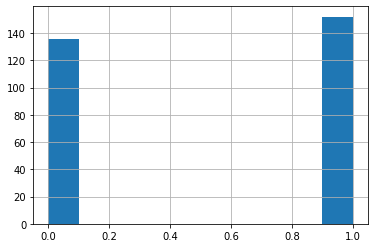

In [369]:
df_final2.competitor_experience_1.hist()
#plt.show()

In [10]:
df_final1.head() # 1 Yes 0 No 

,employee_code,work1_flag,work2_flag,work3_flag,work4_flag,work5_flag,work6_flag,work7_flag,competitor_experience
0,BDP,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
1,F6Q,NaN,Rogers,NaN,NaN,NaN,NaN,NaN,1
2,MRN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
3,MXO,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
4,N0Y,NaN,Best Buy,NaN,NaN,NaN,NaN,NaN,1


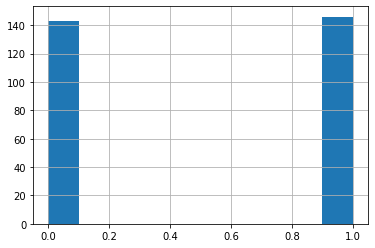

In [370]:
df_final1.competitor_experience.hist()
plt.show()

In [197]:
df_final.to_csv("../result/competitor_experience.csv", index=False)